In [19]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
from tensorflow.keras.optimizers import RMSprop
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
import cv2
import os
import glob
from tensorflow.keras.preprocessing.image import load_img, img_to_array

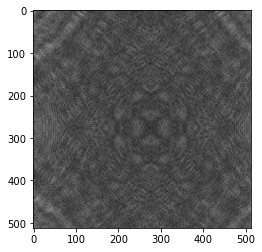

In [29]:
img = image.load_img('input/1056lab-defect-detection/train/Class1/1.png')
plt.imshow(img)


In [73]:
cv2.imread('input/DataAugmentation/train/Class/Class1/1.png', cv2.IMREAD_GRAYSCALE).shape

(512, 512)

In [13]:
train = ImageDataGenerator(rescale = 1/255)
validation = ImageDataGenerator(rescale = 1/255)

In [62]:
train_dataset = train.flow_from_directory('input/DataAugmentation/train/Class', 
                                          target_size=(512,512), batch_size=3, class_mode='binary')

test_dataset = train.flow_from_directory('input/DataAugmentation/test/Class', 
                                          target_size=(512,512), batch_size=3, class_mode='binary')

Found 1330 images belonging to 2 classes.
Found 380 images belonging to 2 classes.


In [63]:
train_dataset.class_indices

{'Class1': 0, 'Class1_def': 1}

In [64]:
train_dataset.classes

array([0, 0, 0, ..., 1, 1, 1])

In [84]:
import random

train_dataset.random

AttributeError: 'DirectoryIterator' object has no attribute 'random'

In [65]:
model = tf.keras.models.Sequential([ tf.keras.layers.Conv2D(16,(3,3),activation = 'relu',input_shape = (512,512,3)),
                                    tf.keras.layers.MaxPool2D(2,2),
                                    
                                    tf.keras.layers.Conv2D(16,(3,3),activation='relu'),
                                    tf.keras.layers.MaxPool2D(2,2),
                                    
                                    tf.keras.layers.Conv2D(16,(3,3),activation='relu'),
                                    tf.keras.layers.MaxPool2D(2,2),
                                    
                                    tf.keras.layers.Flatten(),
                                    tf.keras.layers.Dense(512, activation='relu'),
                                    tf.keras.layers.Dense(1, activation='sigmoid') # change it to softmax for multi class classifier
                                   ])

In [66]:
model.compile(loss='binary_crossentropy',
             optimizer = RMSprop(lr=0.001),
             metrics=['accuracy'])

In [67]:
model_fit = model.fit(train_dataset, steps_per_epoch=100, epochs=20,validation_data=test_dataset)

Epoch 1/20
100/100 [==============================] - 126s 1s/step - loss: 1.4500 - accuracy: 0.5533 - val_loss: 0.6925 - val_accuracy: 0.5263
Epoch 2/20
100/100 [==============================] - 132s 1s/step - loss: 0.8486 - accuracy: 0.5134 - val_loss: 0.6926 - val_accuracy: 0.5263
Epoch 3/20
100/100 [==============================] - 126s 1s/step - loss: 0.6990 - accuracy: 0.5100 - val_loss: 0.6936 - val_accuracy: 0.4737
Epoch 4/20
100/100 [==============================] - 125s 1s/step - loss: 0.7791 - accuracy: 0.5367 - val_loss: 0.6891 - val_accuracy: 0.5526
Epoch 5/20
100/100 [==============================] - 126s 1s/step - loss: 0.7868 - accuracy: 0.5267 - val_loss: 0.6320 - val_accuracy: 0.6289
Epoch 6/20
100/100 [==============================] - 127s 1s/step - loss: 0.7257 - accuracy: 0.5633 - val_loss: 0.6341 - val_accuracy: 0.6316
Epoch 7/20
100/100 [==============================] - 128s 1s/step - loss: 0.7147 - accuracy: 0.6233 - val_loss: 0.6058 - val_accuracy: 0.6526

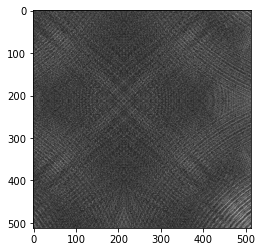

Defect


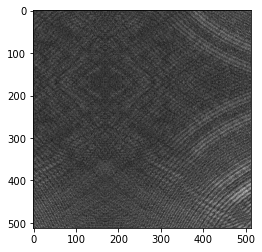

Defect


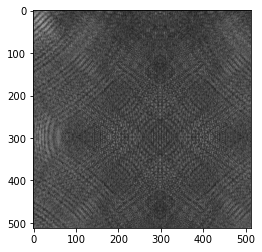

Defect


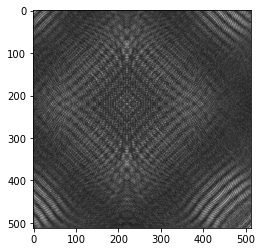

Defect


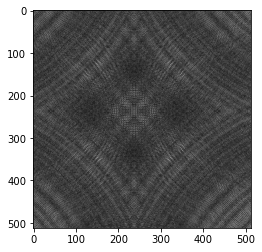

Defect


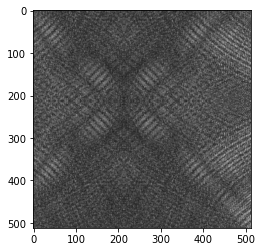

Defect


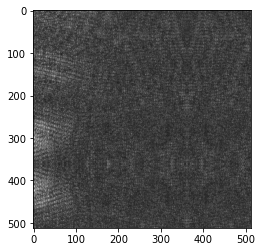

Defect


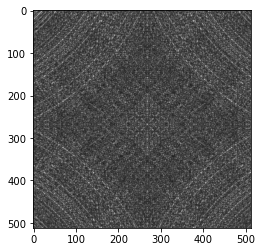

Defect


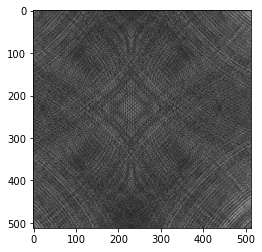

Defect


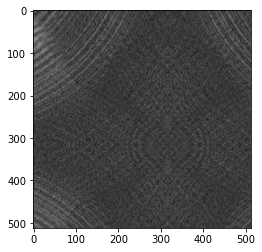

Defect


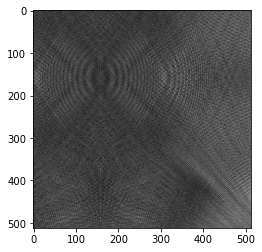

Defect


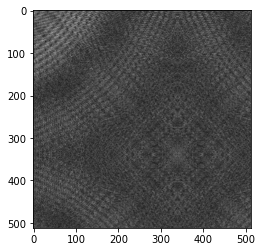

Defect


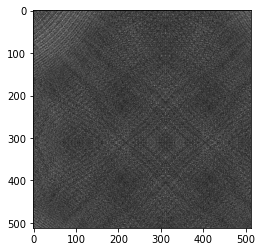

Defect


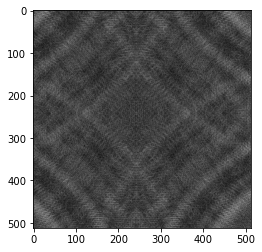

Defect


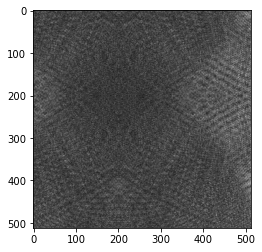

Defect


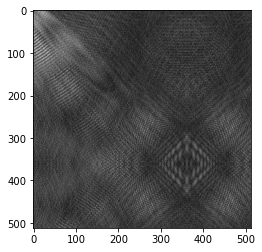

Defect


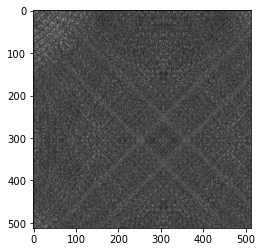

Defect


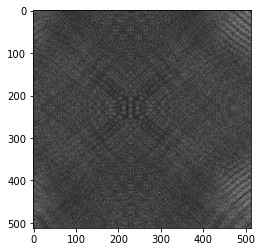

Defect


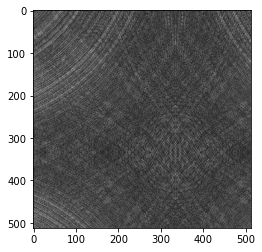

Defect


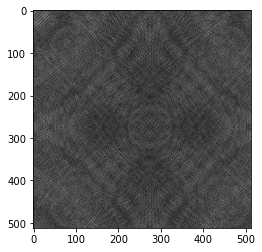

Defect


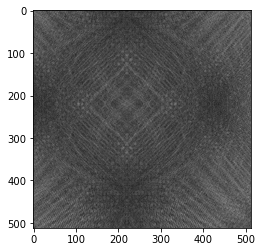

Defect


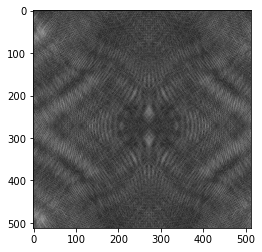

Defect


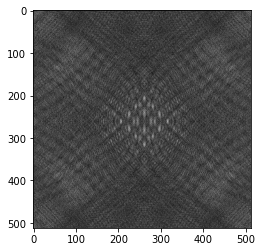

Defect


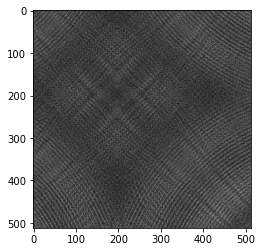

Defect


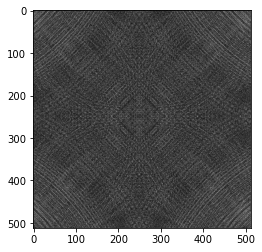

Defect


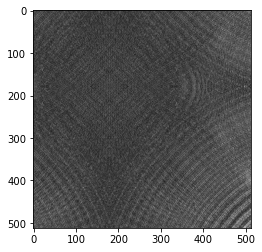

Defect


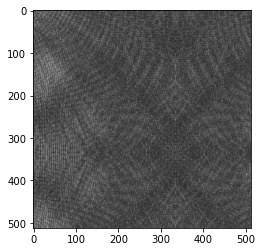

Defect


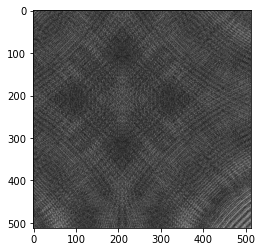

Defect


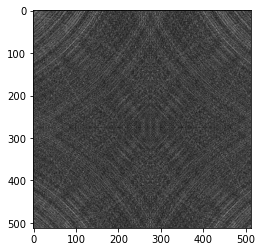

Defect


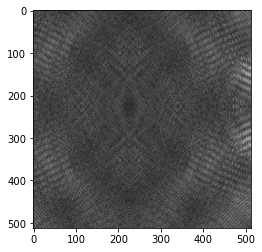

Defect


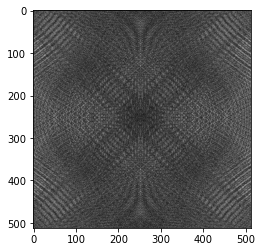

Defect


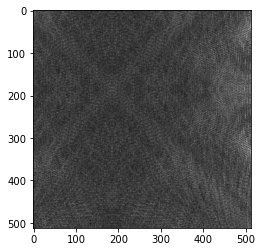

Defect


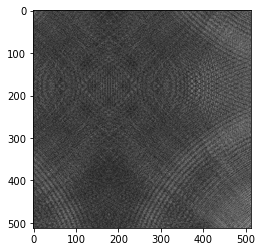

Defect


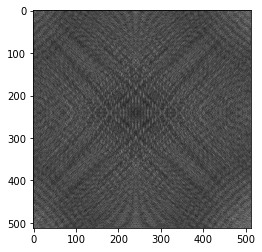

Defect


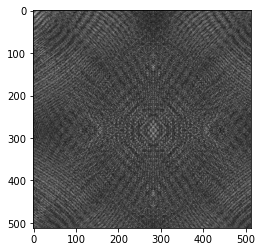

Defect


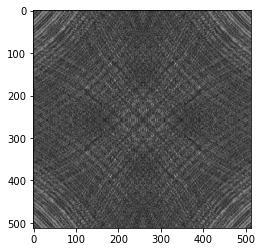

Defect


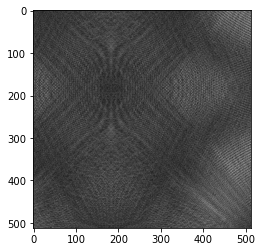

Defect


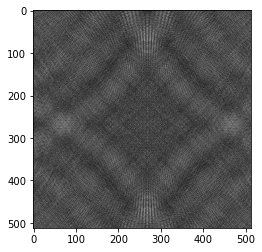

Defect


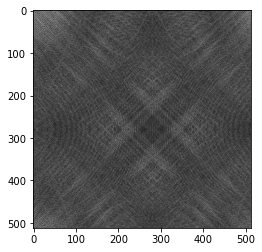

Defect


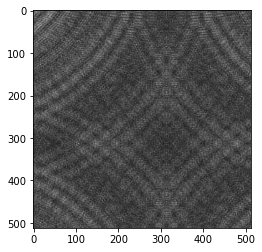

Defect


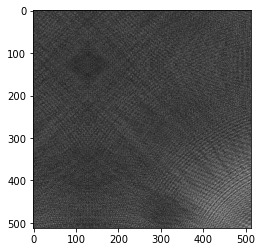

Defect


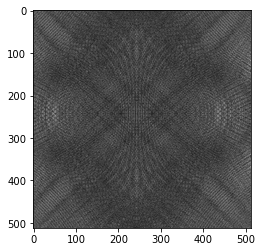

Defect


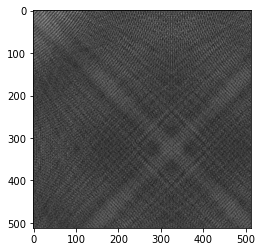

Defect


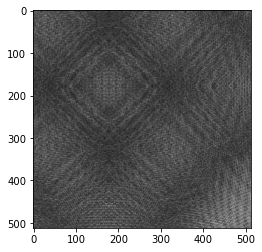

Defect


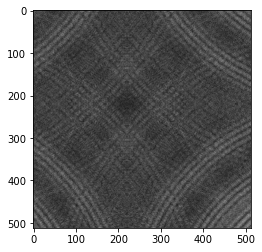

Defect


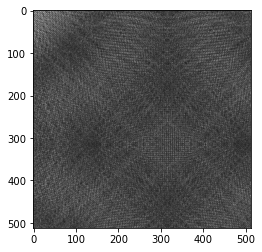

Defect


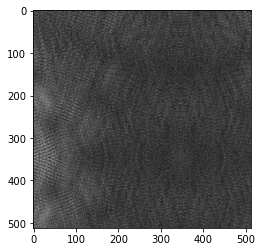

Defect


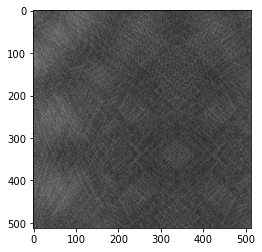

Defect


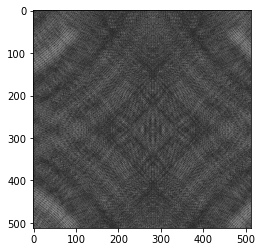

Defect


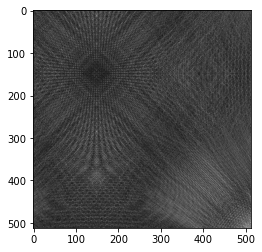

Defect


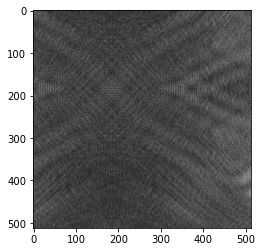

Defect


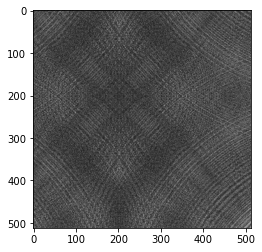

Defect


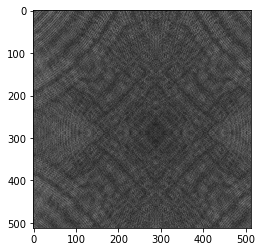

Defect


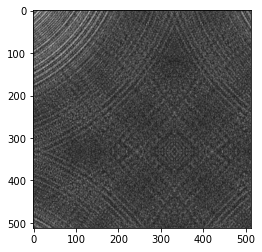

Defect


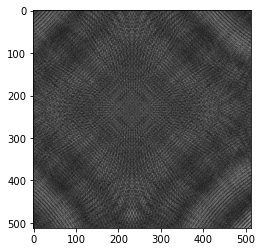

Defect


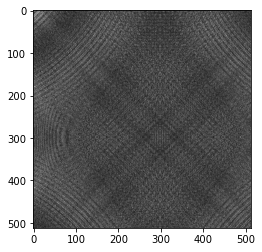

Defect


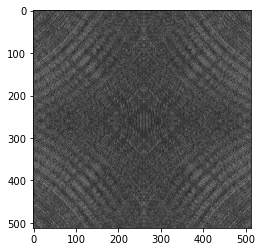

Defect


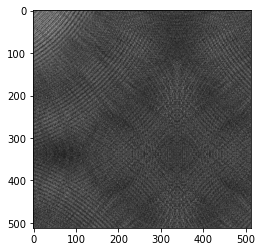

Defect


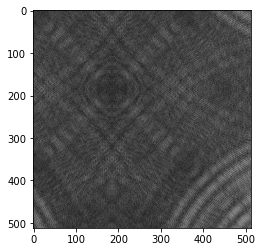

Defect


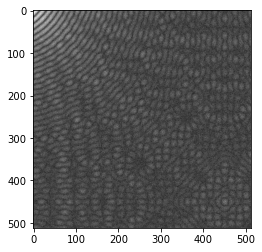

Defect


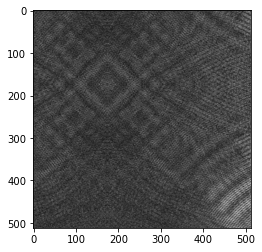

Defect


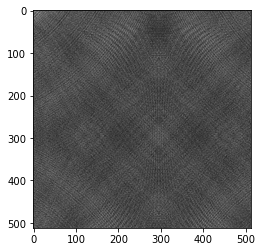

Defect


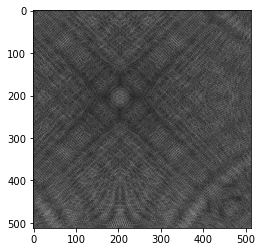

Defect


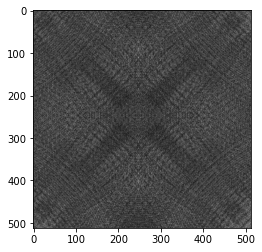

Defect


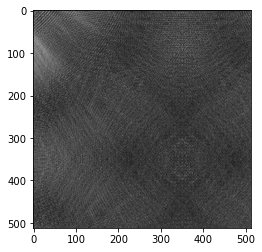

Defect


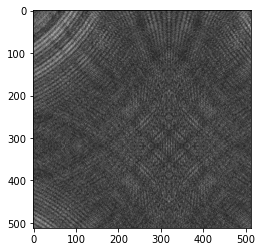

Defect


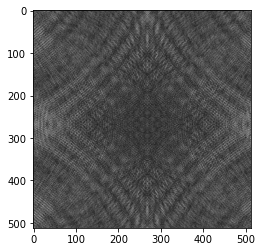

Defect


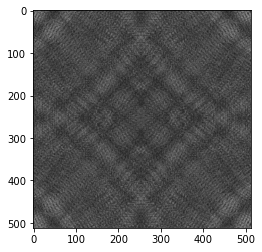

Defect


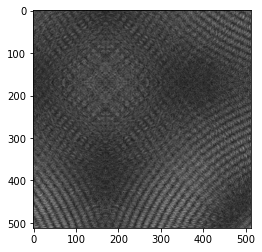

Defect


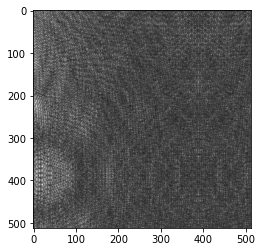

Defect


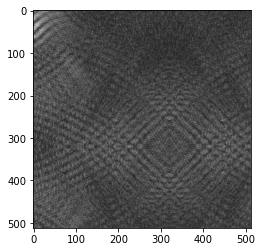

Defect


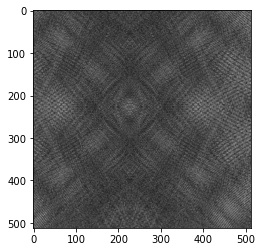

Defect


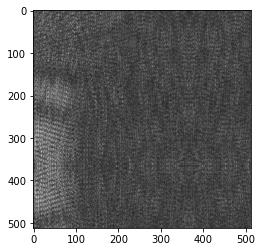

Defect


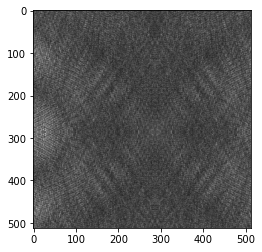

Defect


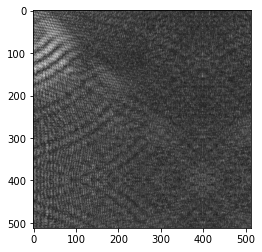

Defect


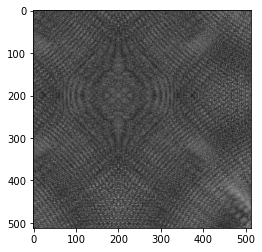

Defect


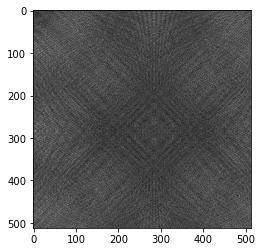

Defect


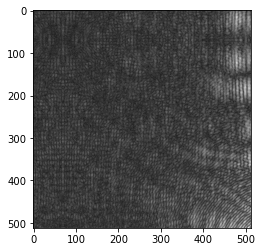

Defect


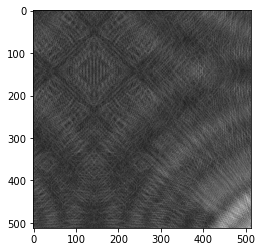

Defect


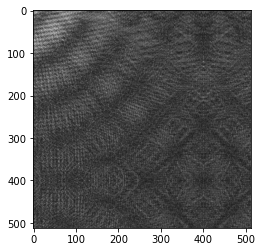

Defect


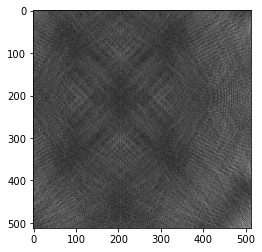

Defect


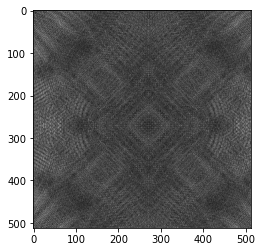

Defect


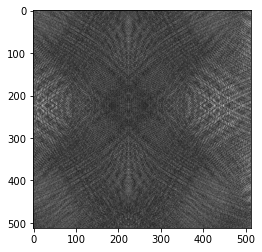

Defect


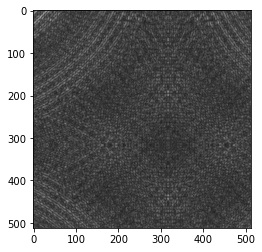

Defect


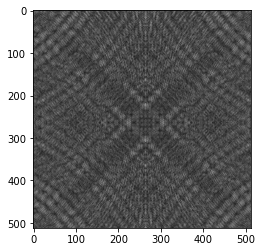

Defect


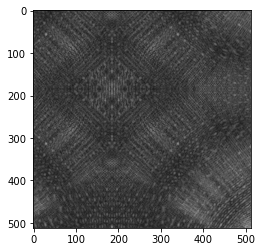

Defect


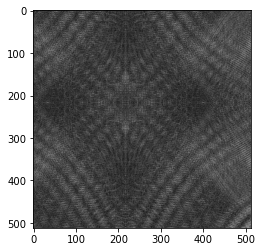

Defect


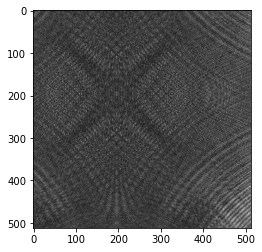

Defect


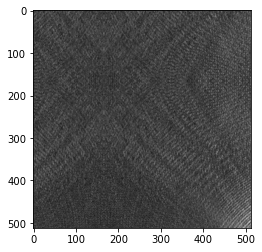

Defect


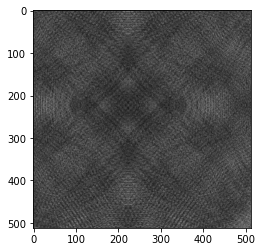

Defect


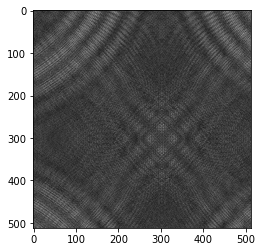

Defect


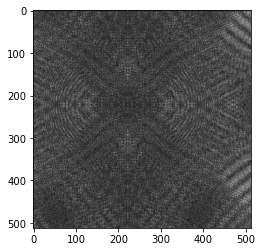

Defect


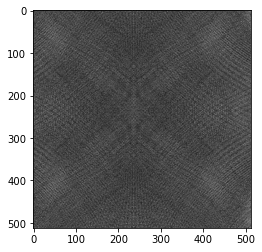

Defect


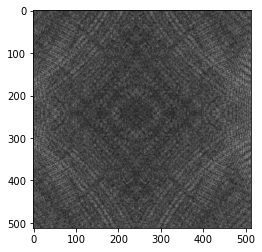

Defect


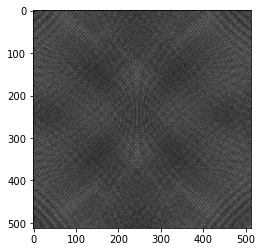

Defect


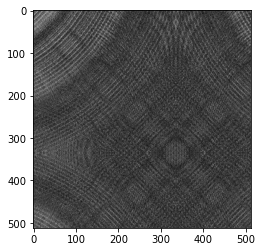

Defect


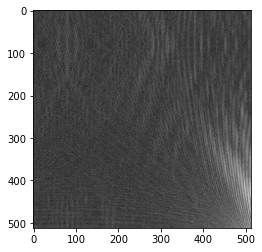

Defect


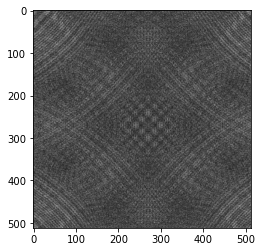

Defect


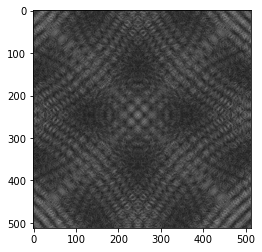

Defect


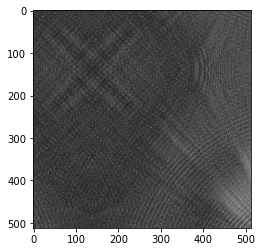

Defect


In [76]:
test_dir = 'input/DataAugmentation/validation/Class/Class1'
for i in os.listdir(test_dir):
    img = image.load_img(test_dir + '/' + i, target_size=(512,512))
    plt.imshow(img)
    plt.show()
    
    X= image.img_to_array(img)
    X = np.expand_dims(X,axis=0)
    images = np.vstack([X])
    val = model.predict(images)
    if val ==0:
        print("Not Defect")
    if val ==1:
        print("Defect")

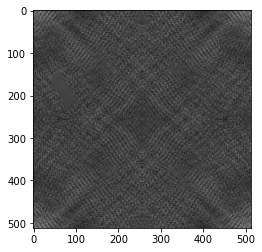

Defect


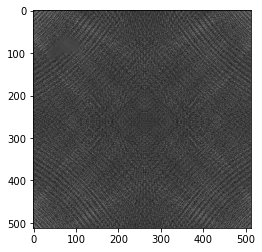

Defect


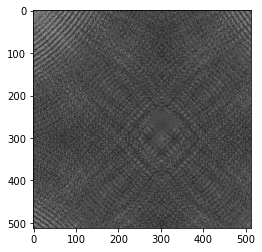

Defect


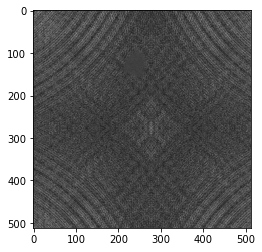

Defect


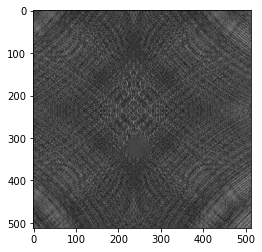

Defect


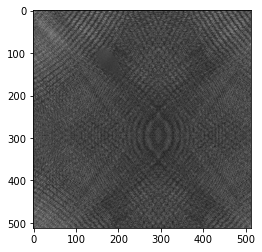

Defect


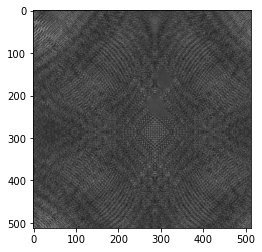

Defect


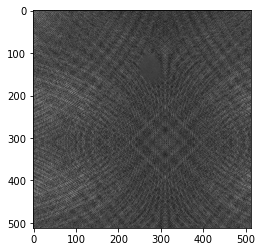

Defect


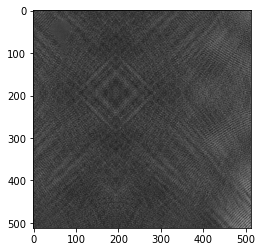

Defect


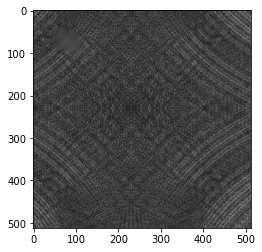

Defect


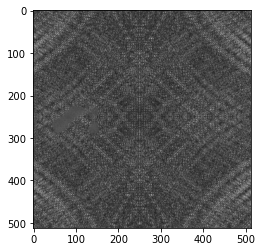

Defect


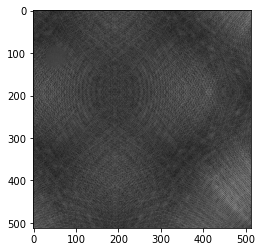

Defect


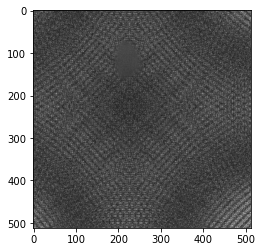

Defect


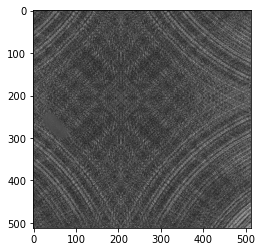

Defect


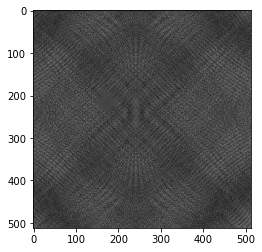

Defect


In [74]:
test_dir = 'input/DataAugmentation/validation/Class1_def'
for i in os.listdir(test_dir):
    img = image.load_img(test_dir + '/' + i, target_size=(512,512))
    plt.imshow(img)
    plt.show()
    
    X= image.img_to_array(img)
    X = np.expand_dims(X,axis=0)
    images = np.vstack([X])
    val = model.predict(images)
    if val ==0:
        print("Not Defect")
    if val ==1:
        print("Defect")